<a href="https://colab.research.google.com/github/robinsonmirandaco/galaxy-m51-vision-ai/blob/main/galaxy_m51_vision_ai_RobinsonMiranda.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Procesamiento Digital de Imágenes Astronómicas: Análisis Comparativo sobre la Galaxia M51

**Autor:** Robinson J. Miranda Pérez

**Máster en Inteligencia Artificial**  

**Proyecto  – Procesamiento de imágenes astronómicas**  

**Nombre Formal:** Messier 51 (M51), también conocida como NGC 5194 o Galaxia del Remolino (Whirlpool Galaxy).

**Imágenes utilizadas:** Galaxia M51 (fuentes: NASA, ESA)

**Formato de entrega:** Notebook técnico

**Fecha:** Mayo de 2025

## Objetivo del procesamiento

El objetivo principal de este trabajo individual es explorar en profundidad la aplicación práctica de filtros espaciales y morfológicos en el procesamiento digital de imágenes astronómicas reales.

En particular, se trabajó con cuatro vistas distintas de la galaxia Messier 51 (M51), también conocida como Whirlpool Galaxy, con el fin de evaluar cómo diferentes técnicas de preprocesamiento pueden mejorar la calidad visual y estructural de este tipo de imágenes.

Al aplicar conjuntamente filtros espaciales y morfológicos en este contexto, se busca:

- Mejorar la calidad general de las imágenes, mediante la reducción de ruido y el aumento de contraste.
- Resaltar estructuras galácticas específicas, tales como brazos espirales, núcleo central y regiones de formación estelar.
- Facilitar la segmentación de regiones relevantes como paso previo al análisis computacional.
- Generar un análisis previo que pueda integrarse a métodos más complejos de procesamiento y extracción de información.

Para alcanzar estos objetivos, se requiere:

- Elegir los filtros adecuados en función del tipo de imagen y del propósito del análisis.
- Aplicar los filtros en el orden correcto para evitar pérdida de información clave.
- Ajustar correctamente los parámetros de cada filtro, como el tamaño del kernel o el número de iteraciones.
- Evaluar los resultados mediante comparaciones visuales, histogramas y pruebas con ruido artificial.

## Estrategia utilizada

La estrategia seguida en este trabajo consistió en:

- Aplicar inicialmente filtros espaciales con el objetivo de preparar las imágenes mediante la reducción del ruido general.
- Aplicar posteriormente filtros morfológicos para manipular las estructuras internas de las imágenes, como regiones luminosas o formas conectadas.

Luego de realizado lo anterior, se procedió a validar la combinación de los filtros mediante una comparación visual entre las imágenes originales y las procesadas. Finalmente, se aplicó una fase de prueba con ruido artificial tipo “sal y pimienta” para evaluar la robustez del procesamiento. Como parte del análisis, se consideraron aspectos como la conservación de bordes, la eliminación de ruido y la claridad de las estructuras galácticas.

## Proceso llevado a cabo

Las imágenes utilizadas para este trabajo corresponden a cuatro vistas distintas de la galaxia Messier 51 (M51), obtenidas de fuentes oficiales como NASA y ESA. A continuación, se presentan estas imágenes en su forma original, acompañadas de una breve descripción técnica:

### Las imágenes utilizadas en este trabajo son las siguientes:

| Vista | Nombre del archivo     | Descripción breve                                                                 |
|-------|------------------------|-----------------------------------------------------------------------------------|
| 1     | m51_visible.jpg        | Imagen en luz visible (Hubble). Estructura natural y morfología definida.         |
| 2     | m51_infrared.jpg       | Imagen en infrarrojo. Muestra regiones calientes y zonas de formación estelar.    |
| 3     | m51_composite.jpg      | Composición multiespectral. Colores intensos y zonas activas acentuadas.          |
| 4     | m51_sunflower.jpg      | Versión artística. Resalta visualmente la espiral de la galaxia.                  |

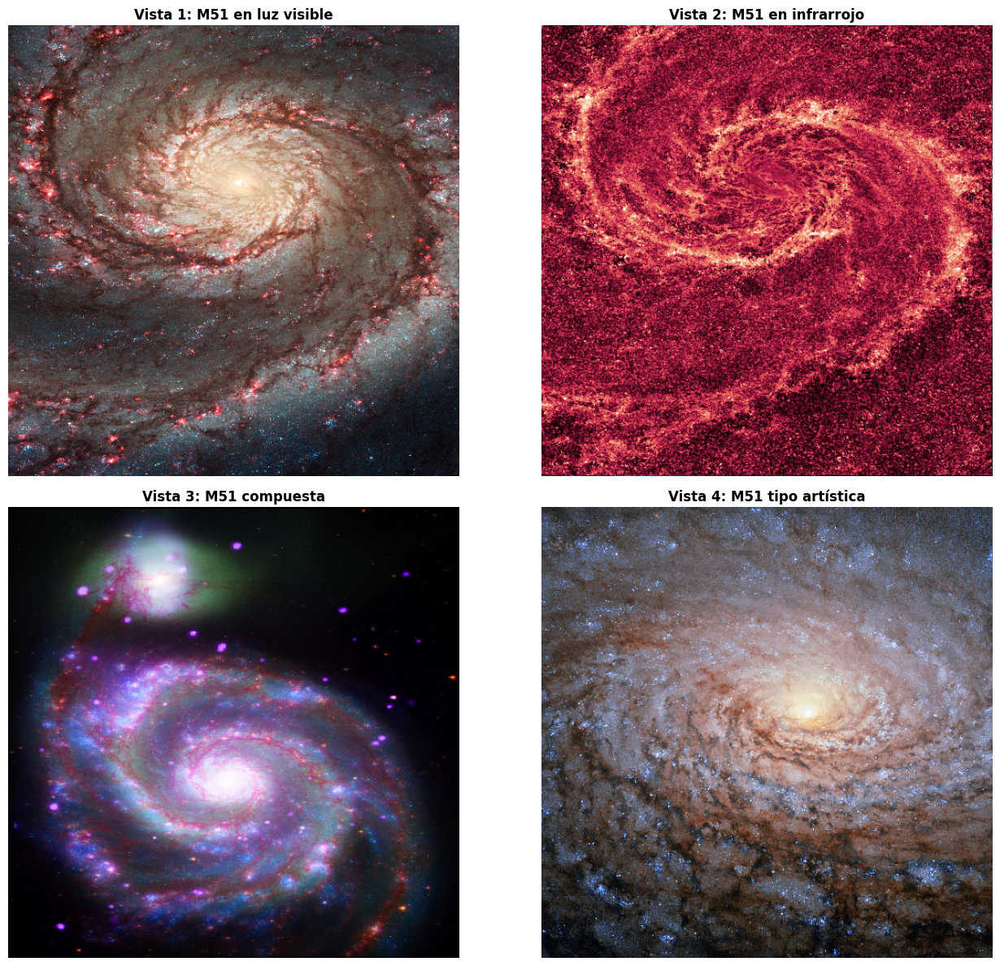

In [3]:
import matplotlib.pyplot as plt
import cv2
import os

# Lista de imágenes y sus descripciones
images_info = [
    ("m51_visible.jpg", "Vista 1: M51 en luz visible",
     "Captada por el Telescopio Espacial Hubble. Muestra la estructura galáctica en espectro óptico."),

    ("m51_infrared.jpg", "Vista 2: M51 en infrarrojo",
     "Imagen infrarroja. Resalta regiones calientes y zonas activas de formación estelar."),

    ("m51_composite.jpg", "Vista 3: M51 compuesta",
     "Composición multiespectral con colores realzados. Integra diferentes longitudes de onda."),

    ("m51_sunflower.jpg", "Vista 4: M51 tipo artística",
     "Versión artística que enfatiza la espiral galáctica con color interpretativo.")
]

# Crear figura
fig, axes = plt.subplots(2, 2, figsize=(14, 12))
i = 0

for ax in axes.flat:
    if i < len(images_info):
        filename, title, desc = images_info[i]
        filepath = f"/content/mnt/data/{filename}"

        if os.path.exists(filepath):
            img = cv2.imread(filepath)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            resized = cv2.resize(img, (512, 512))

            ax.imshow(resized)
            ax.set_title(title, fontsize=12, weight='bold')
            ax.set_xlabel(desc, fontsize=10)
            ax.axis("off")
        else:
            ax.text(0.5, 0.5, f"Archivo no encontrado:\n{filename}",
                    ha='center', va='center', fontsize=10, color='red')
            ax.axis("off")
    i += 1

plt.tight_layout()
plt.show()

> **Figura 1.** Vistas seleccionadas de la galaxia Messier 51 (M51). Incluye: (1) imagen en luz visible captada por el Telescopio Espacial Hubble; (2) imagen infrarroja; (3) composición multiespectral; y (4) visualización artística.  
> *Fuente: NASA/ESA (s.f.)*

### Vista 1 – Galaxia M51 en luz visible

A continuación, se aplica el pipeline completo de procesamiento a la primera imagen, captada por el Telescopio Espacial Hubble en el espectro visible.

El flujo de procesamiento incluyó los siguientes pasos:
1. Conversión a escala de grises
2. Aplicación del filtro Gaussiano para suavizado
3. Detección de bordes mediante el filtro Laplaciano
4. Aplicación del operador Sobel combinado (X + Y)
5. Umbral adaptativo inverso para segmentación
6. Operación morfológica de apertura
7. Operación morfológica de cierre
8. Detección de contornos
9. Superposición de los contornos sobre la imagen original


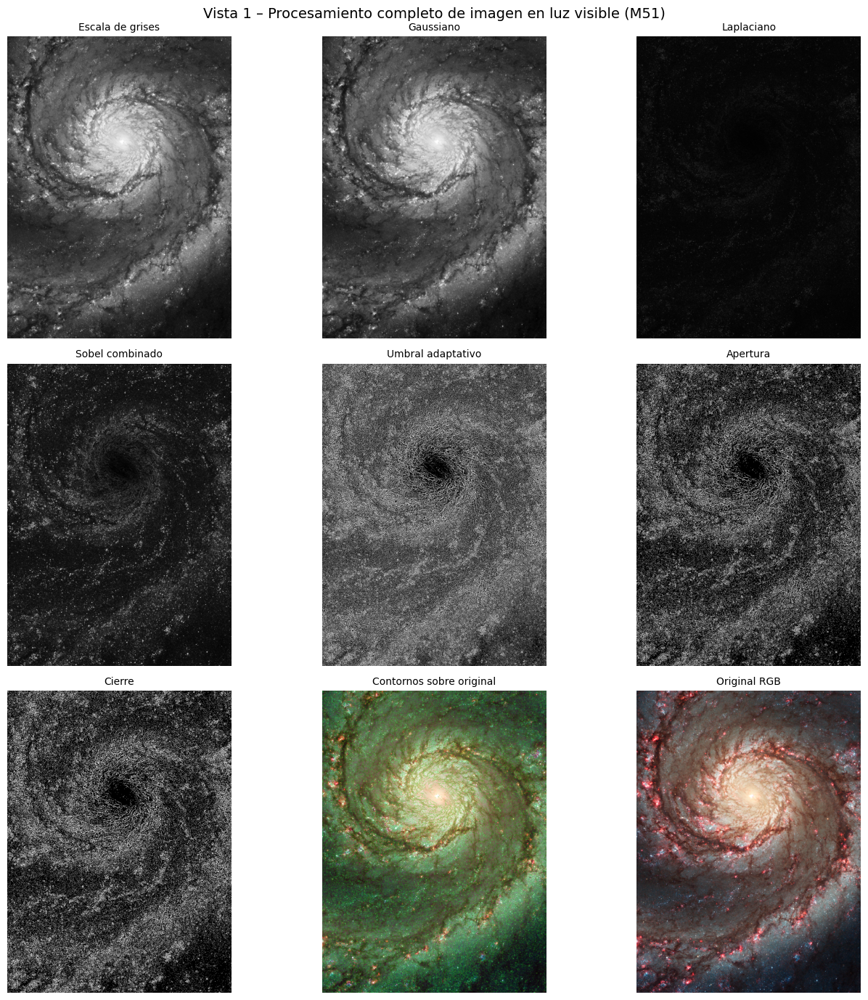

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 1. Cargar la imagen original
img = cv2.imread("/content/mnt/data/m51_visible.jpg")
original_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # para visualizar

# 2. Conversión a escala de grises
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# 3. Filtro Gaussiano (suavizado)
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

# 4. Filtro Laplaciano (segunda derivada)
laplacian = cv2.Laplacian(blurred, cv2.CV_64F)
laplacian = cv2.convertScaleAbs(laplacian)

# 5. Filtro Sobel combinado (bordes X + Y)
sobelx = cv2.Sobel(blurred, cv2.CV_64F, 1, 0, ksize=3)
sobely = cv2.Sobel(blurred, cv2.CV_64F, 0, 1, ksize=3)
sobel_magnitude = cv2.magnitude(sobelx, sobely)
sobel_combined = cv2.convertScaleAbs(sobel_magnitude)

# 6. Umbral adaptativo inverso
adaptive_thresh = cv2.adaptiveThreshold(
    blurred, 255,
    cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    cv2.THRESH_BINARY_INV,
    blockSize=11,
    C=2
)

# 7. Operación morfológica de apertura
kernel = np.ones((3, 3), np.uint8)
opening = cv2.morphologyEx(adaptive_thresh, cv2.MORPH_OPEN, kernel)

# 8. Operación morfológica de cierre
closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel)

# 9. Detección de contornos sobre la imagen original
contours, _ = cv2.findContours(closing, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
img_contours = img.copy()
cv2.drawContours(img_contours, contours, -1, (0, 255, 0), 1)
img_contours_rgb = cv2.cvtColor(img_contours, cv2.COLOR_BGR2RGB)
# Crear lista con imágenes y títulos
titles = [
    "Escala de grises", "Gaussiano", "Laplaciano",
    "Sobel combinado", "Umbral adaptativo", "Apertura",
    "Cierre", "Contornos sobre original", "Original RGB"
]

images = [
    gray, blurred, laplacian,
    sobel_combined, adaptive_thresh, opening,
    closing, img_contours_rgb, original_rgb
]

# Mostrar resultados en una cuadrícula 3x3
fig, axes = plt.subplots(3, 3, figsize=(14, 14))
for ax, img, title in zip(axes.flat, images, titles):
    cmap = 'gray' if len(img.shape) == 2 else None
    ax.imshow(img, cmap=cmap)
    ax.set_title(title, fontsize=10)
    ax.axis("off")

plt.suptitle("Vista 1 – Procesamiento completo de imagen en luz visible (M51)", fontsize=14)
plt.tight_layout()
plt.show()


### Vista 1 – Galaxia M51 en luz visible

Se aplicó un flujo completo de procesamiento sobre la imagen en espectro visible de la galaxia M51, captada por el Telescopio Espacial Hubble. Este flujo incluye suavizado, detección de bordes, segmentación y operaciones morfológicas.

> **Figura 2.** Resultados del procesamiento de la imagen en luz visible de la galaxia Messier 51 (M51). Se muestran las etapas clave del pipeline: escala de grises, filtros espaciales (Gaussiano, Laplaciano, Sobel), umbral adaptativo, operaciones morfológicas (apertura y cierre), y contornos sobre la imagen original.  
> *Fuente: Elaboración propia a partir de imágenes cortesía de NASA/ESA.*

### Vista 2 – Imagen infrarroja de la galaxia M51

Se aplicó el mismo pipeline de procesamiento sobre la imagen infrarroja de la galaxia Messier 51 (M51). Esta vista permite destacar zonas activas de formación estelar y regiones con emisión térmica que no son visibles en el espectro óptico.

El flujo de procesamiento incluyó los siguientes pasos:
1. Conversión a escala de grises
2. Aplicación del filtro Gaussiano para suavizado
3. Detección de bordes mediante el filtro Laplaciano
4. Aplicación del operador Sobel combinado (X + Y)
5. Umbral adaptativo inverso para segmentación
6. Operación morfológica de apertura
7. Operación morfológica de cierre
8. Detección de contornos
9. Superposición de los contornos sobre la imagen original

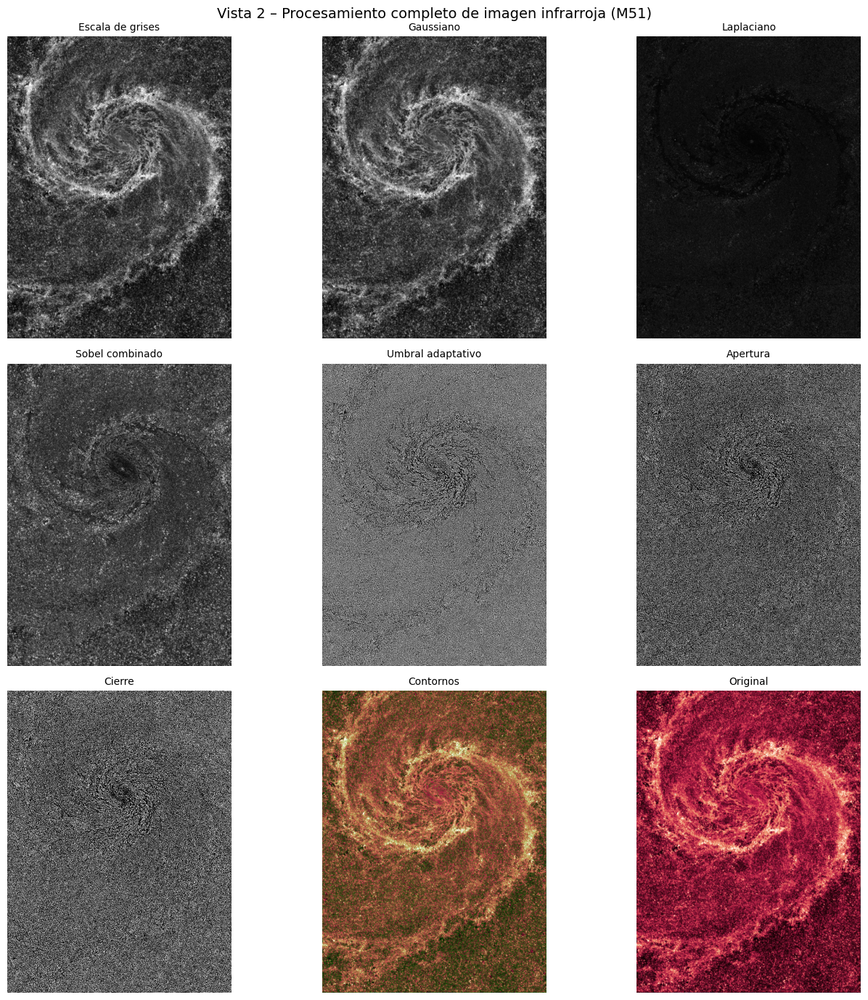

In [5]:
img = cv2.imread("/content/mnt/data/m51_infrared.jpg")
original_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

laplacian = cv2.Laplacian(blurred, cv2.CV_64F)
laplacian = cv2.convertScaleAbs(laplacian)

sobelx = cv2.Sobel(blurred, cv2.CV_64F, 1, 0, ksize=3)
sobely = cv2.Sobel(blurred, cv2.CV_64F, 0, 1, ksize=3)
sobel_magnitude = cv2.magnitude(sobelx, sobely)
sobel_combined = cv2.convertScaleAbs(sobel_magnitude)

adaptive_thresh = cv2.adaptiveThreshold(
    blurred, 255,
    cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    cv2.THRESH_BINARY_INV,
    blockSize=11,
    C=2
)

kernel = np.ones((3, 3), np.uint8)
opening = cv2.morphologyEx(adaptive_thresh, cv2.MORPH_OPEN, kernel)
closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel)

contours, _ = cv2.findContours(closing, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
img_contours = img.copy()
cv2.drawContours(img_contours, contours, -1, (0, 255, 0), 1)
img_contours_rgb = cv2.cvtColor(img_contours, cv2.COLOR_BGR2RGB)

titles = [
    "Escala de grises", "Gaussiano", "Laplaciano",
    "Sobel combinado", "Umbral adaptativo", "Apertura",
    "Cierre", "Contornos", "Original"
]

images = [
    gray, blurred, laplacian,
    sobel_combined, adaptive_thresh, opening,
    closing, img_contours_rgb, original_rgb
]

fig, axes = plt.subplots(3, 3, figsize=(14, 14))
for ax, img, title in zip(axes.flat, images, titles):
    cmap = 'gray' if len(img.shape) == 2 else None
    ax.imshow(img, cmap=cmap)
    ax.set_title(title, fontsize=10)
    ax.axis("off")

plt.suptitle("Vista 2 – Procesamiento completo de imagen infrarroja (M51)", fontsize=14)
plt.tight_layout()
plt.show()


### Vista 2 – Imagen infrarroja de la galaxia M51

La imagen infrarroja de la galaxia Messier 51 (M51) resalta regiones con alta emisión térmica, como zonas activas de formación estelar. Se aplicó el mismo flujo de procesamiento para analizar sus estructuras internas.

> **Figura 3.** Procesamiento completo de la imagen infrarroja de la galaxia M51. Se muestran nueve pasos consecutivos del análisis, desde la conversión a escala de grises hasta la detección de contornos.  
> *Fuente: Elaboración propia a partir de imágenes de NASA/ESA.*

### Vista 3 – Imagen compuesta de la galaxia M51

Esta imagen compuesta de la galaxia Messier 51 (M51) combina información de múltiples longitudes de onda, permitiendo una visualización más completa y detallada de sus estructuras. El objetivo es aplicar el mismo pipeline de procesamiento para resaltar regiones activas, contrastes y formas clave.

El flujo de procesamiento incluyó los siguientes pasos:
1. Conversión a escala de grises
2. Aplicación del filtro Gaussiano para suavizado
3. Detección de bordes mediante el filtro Laplaciano
4. Aplicación del operador Sobel combinado (X + Y)
5. Umbral adaptativo inverso para segmentación
6. Operación morfológica de apertura
7. Operación morfológica de cierre
8. Detección de contornos
9. Superposición de los contornos sobre la imagen original


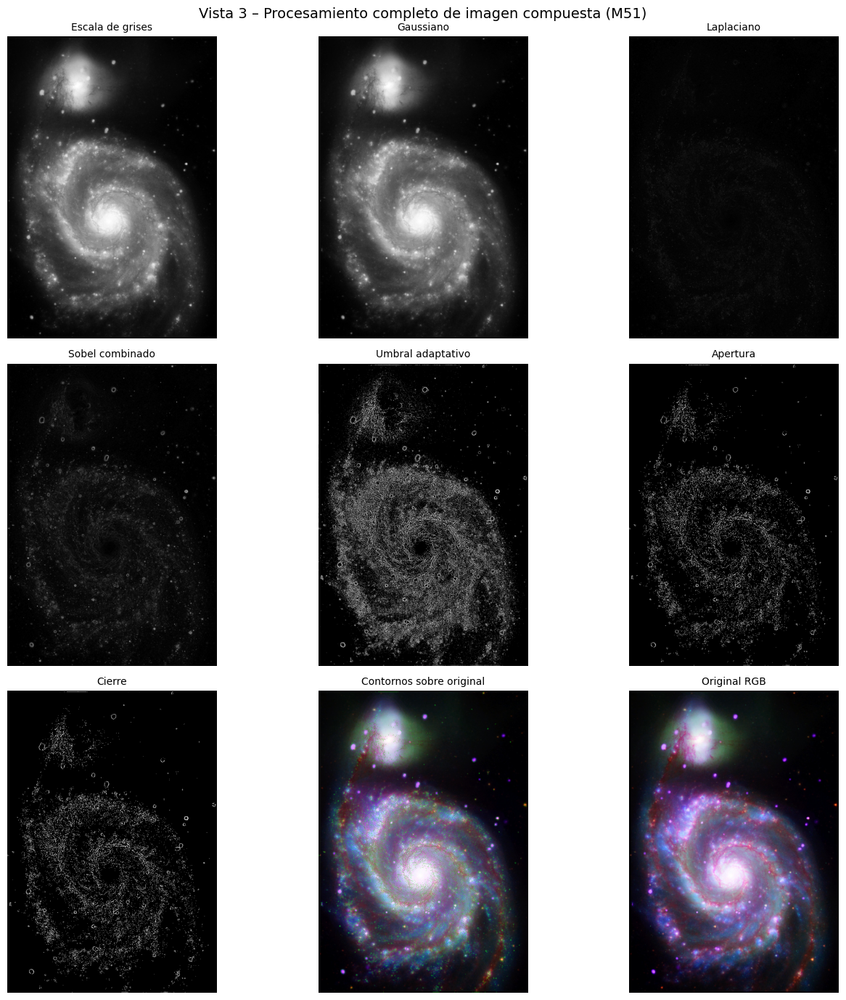

In [6]:
img = cv2.imread("/content/mnt/data/m51_composite.jpg")
original_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

laplacian = cv2.Laplacian(blurred, cv2.CV_64F)
laplacian = cv2.convertScaleAbs(laplacian)

sobelx = cv2.Sobel(blurred, cv2.CV_64F, 1, 0, ksize=3)
sobely = cv2.Sobel(blurred, cv2.CV_64F, 0, 1, ksize=3)
sobel_magnitude = cv2.magnitude(sobelx, sobely)
sobel_combined = cv2.convertScaleAbs(sobel_magnitude)

adaptive_thresh = cv2.adaptiveThreshold(
    blurred, 255,
    cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    cv2.THRESH_BINARY_INV,
    blockSize=11,
    C=2
)

kernel = np.ones((3, 3), np.uint8)
opening = cv2.morphologyEx(adaptive_thresh, cv2.MORPH_OPEN, kernel)
closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel)

contours, _ = cv2.findContours(closing, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
img_contours = img.copy()
cv2.drawContours(img_contours, contours, -1, (0, 255, 0), 1)
img_contours_rgb = cv2.cvtColor(img_contours, cv2.COLOR_BGR2RGB)

titles = [
    "Escala de grises", "Gaussiano", "Laplaciano",
    "Sobel combinado", "Umbral adaptativo", "Apertura",
    "Cierre", "Contornos sobre original", "Original RGB"
]

images = [
    gray, blurred, laplacian,
    sobel_combined, adaptive_thresh, opening,
    closing, img_contours_rgb, original_rgb
]

fig, axes = plt.subplots(3, 3, figsize=(14, 14))
for ax, img, title in zip(axes.flat, images, titles):
    cmap = 'gray' if len(img.shape) == 2 else None
    ax.imshow(img, cmap=cmap)
    ax.set_title(title, fontsize=10)
    ax.axis("off")

plt.suptitle("Vista 3 – Procesamiento completo de imagen compuesta (M51)", fontsize=14)
plt.tight_layout()
plt.show()


La imagen compuesta permitió evidenciar con mayor claridad las diferencias de intensidad y contraste entre las regiones internas de la galaxia. El procesamiento fue efectivo para identificar bordes estructurales, zonas activas y patrones de formación.

> **Figura 4.** Procesamiento completo de la imagen compuesta de la galaxia M51. Se incluyen nueve pasos del pipeline, desde la escala de grises hasta la detección de contornos superpuestos.  
> *Fuente: Elaboración propia a partir de imágenes de NASA/ESA.*

### Vista 4 – Imagen artística de la galaxia M51

Esta versión artística de la galaxia Messier 51 (M51) fue generada con fines visuales y educativos, acentuando su forma espiral y contrastes internos. Aunque no representa una captura directa de espectro específico, es útil para validar la robustez del pipeline ante variaciones estilizadas.

El flujo de procesamiento incluyó los siguientes pasos:
1. Conversión a escala de grises
2. Aplicación del filtro Gaussiano para suavizado
3. Detección de bordes mediante el filtro Laplaciano
4. Aplicación del operador Sobel combinado (X + Y)
5. Umbral adaptativo inverso para segmentación
6. Operación morfológica de apertura
7. Operación morfológica de cierre
8. Detección de contornos
9. Superposición de los contornos sobre la imagen original

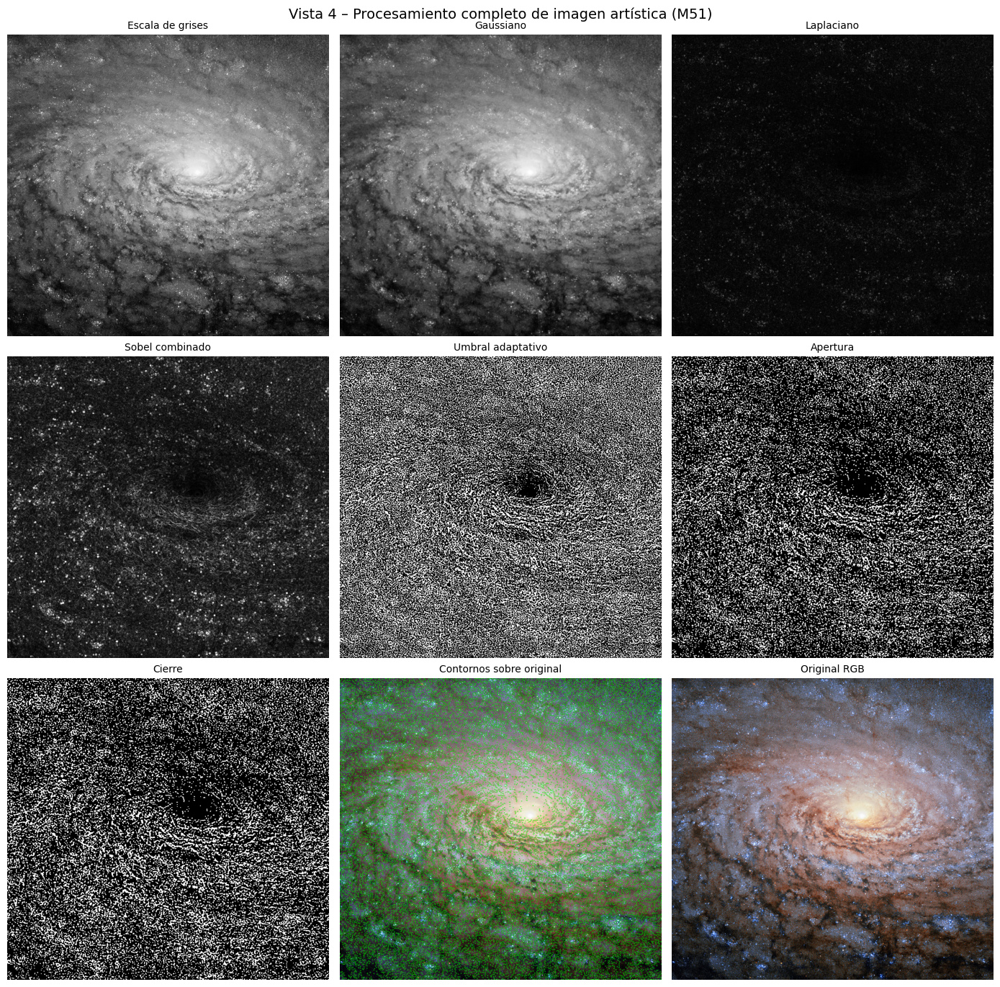

In [7]:
# Vista 4 – Procesamiento completo para la imagen artística de la galaxia M51

img = cv2.imread("/content/mnt/data/m51_sunflower.jpg")
original_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# 1. Escala de grises
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# 2. Filtro Gaussiano
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

# 3. Filtro Laplaciano
laplacian = cv2.Laplacian(blurred, cv2.CV_64F)
laplacian = cv2.convertScaleAbs(laplacian)

# 4. Sobel combinado
sobelx = cv2.Sobel(blurred, cv2.CV_64F, 1, 0, ksize=3)
sobely = cv2.Sobel(blurred, cv2.CV_64F, 0, 1, ksize=3)
sobel_magnitude = cv2.magnitude(sobelx, sobely)
sobel_combined = cv2.convertScaleAbs(sobel_magnitude)

# 5. Umbral adaptativo inverso
adaptive_thresh = cv2.adaptiveThreshold(
    blurred, 255,
    cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    cv2.THRESH_BINARY_INV,
    blockSize=11,
    C=2
)

# 6. Apertura
kernel = np.ones((3, 3), np.uint8)
opening = cv2.morphologyEx(adaptive_thresh, cv2.MORPH_OPEN, kernel)

# 7. Cierre
closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel)

# 8. Detección de contornos
contours, _ = cv2.findContours(closing, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
img_contours = img.copy()
cv2.drawContours(img_contours, contours, -1, (0, 255, 0), 1)
img_contours_rgb = cv2.cvtColor(img_contours, cv2.COLOR_BGR2RGB)

# 9. Visualización 3x3
titles = [
    "Escala de grises", "Gaussiano", "Laplaciano",
    "Sobel combinado", "Umbral adaptativo", "Apertura",
    "Cierre", "Contornos sobre original", "Original RGB"
]

images = [
    gray, blurred, laplacian,
    sobel_combined, adaptive_thresh, opening,
    closing, img_contours_rgb, original_rgb
]

fig, axes = plt.subplots(3, 3, figsize=(14, 14))
for ax, img, title in zip(axes.flat, images, titles):
    cmap = 'gray' if len(img.shape) == 2 else None
    ax.imshow(img, cmap=cmap)
    ax.set_title(title, fontsize=10)
    ax.axis("off")

plt.suptitle("Vista 4 – Procesamiento completo de imagen artística (M51)", fontsize=14)
plt.tight_layout()
plt.show()

Aunque esta imagen artística no proviene directamente de una banda espectral específica, el pipeline de procesamiento funcionó de manera efectiva para detectar bordes y estructuras internas relevantes. Esto demuestra que el enfoque aplicado también puede ser útil en representaciones visualmente enriquecidas.

> **Figura 5.** Procesamiento completo de la imagen artística de la galaxia M51. Se aplicaron los nueve pasos del pipeline, desde la escala de grises hasta la detección de contornos.  
> *Fuente: Elaboración propia a partir de imágenes de NASA/ESA.*

## Evaluación de la robustez del método ante ruido artificial

Finalmente, se aplicó una fase de prueba con ruido artificial tipo “sal y pimienta” para evaluar la robustez del procesamiento. Este tipo de ruido simula interferencias comunes en sistemas de adquisición de imágenes.

A cada una de las vistas analizadas se le introdujo ruido, y posteriormente se aplicó el mismo pipeline de procesamiento. El objetivo fue verificar si el flujo de trabajo era capaz de mantener la detección de estructuras esenciales bajo condiciones degradadas.

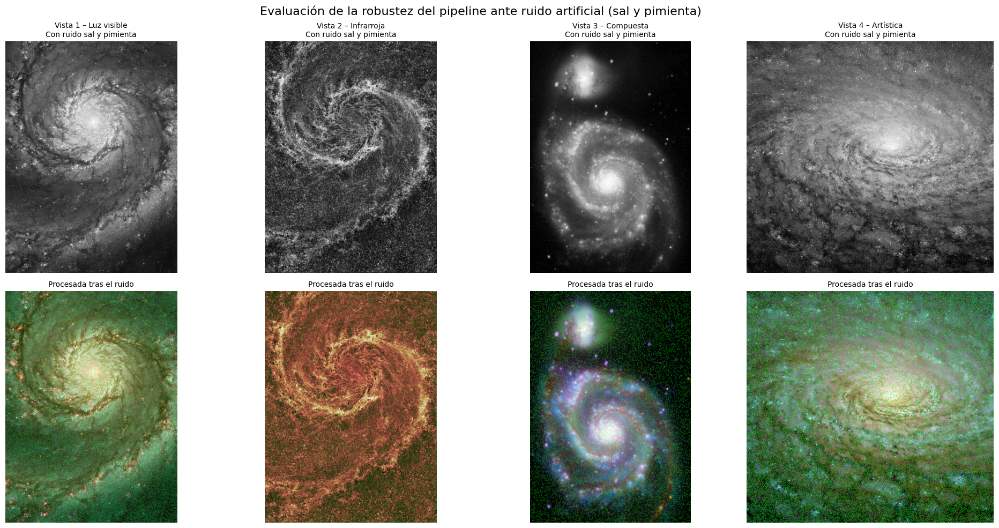

In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Función para añadir ruido tipo "sal y pimienta"
def add_salt_pepper_noise(image, salt_prob=0.01, pepper_prob=0.01):
    noisy = image.copy()
    total_pixels = image.size
    num_salt = int(salt_prob * total_pixels)
    num_pepper = int(pepper_prob * total_pixels)

    # Sal (blanco)
    coords = [np.random.randint(0, i - 1, num_salt) for i in image.shape]
    noisy[tuple(coords)] = 255

    # Pimienta (negro)
    coords = [np.random.randint(0, i - 1, num_pepper) for i in image.shape]
    noisy[tuple(coords)] = 0

    return noisy

# Lista de imágenes y títulos
vistas = [
    ("m51_visible.jpg", "Vista 1 – Luz visible"),
    ("m51_infrared.jpg", "Vista 2 – Infrarroja"),
    ("m51_composite.jpg", "Vista 3 – Compuesta"),
    ("m51_sunflower.jpg", "Vista 4 – Artística")
]

# Crear figura
fig, axes = plt.subplots(2, 4, figsize=(20, 10))

# Procesar cada imagen con ruido y pipeline
for idx, (filename, title) in enumerate(vistas):
    img = cv2.imread(f"/content/mnt/data/{filename}")
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Añadir ruido
    noisy = add_salt_pepper_noise(gray)

    # Pipeline sobre imagen con ruido
    blurred = cv2.GaussianBlur(noisy, (5, 5), 0)
    laplacian = cv2.Laplacian(blurred, cv2.CV_64F)
    laplacian = cv2.convertScaleAbs(laplacian)
    sobelx = cv2.Sobel(blurred, cv2.CV_64F, 1, 0, ksize=3)
    sobely = cv2.Sobel(blurred, cv2.CV_64F, 0, 1, ksize=3)
    sobel_combined = cv2.convertScaleAbs(cv2.magnitude(sobelx, sobely))
    adaptive_thresh = cv2.adaptiveThreshold(
        blurred, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY_INV, 11, 2
    )
    kernel = np.ones((3, 3), np.uint8)
    opening = cv2.morphologyEx(adaptive_thresh, cv2.MORPH_OPEN, kernel)
    closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel)
    contours, _ = cv2.findContours(closing, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    img_contours = img.copy()
    cv2.drawContours(img_contours, contours, -1, (0, 255, 0), 1)
    img_contours_rgb = cv2.cvtColor(img_contours, cv2.COLOR_BGR2RGB)

    # Visualizar
    axes[0, idx].imshow(noisy, cmap='gray')
    axes[0, idx].set_title(f"{title}\nCon ruido sal y pimienta", fontsize=10)
    axes[0, idx].axis("off")

    axes[1, idx].imshow(img_contours_rgb)
    axes[1, idx].set_title("Procesada tras el ruido", fontsize=10)
    axes[1, idx].axis("off")

plt.suptitle("Evaluación de la robustez del pipeline ante ruido artificial (sal y pimienta)", fontsize=16)
plt.tight_layout()
plt.show()

> **Figura 6.** Evaluación de la robustez del pipeline de procesamiento ante ruido artificial (sal y pimienta) en las cuatro vistas de la galaxia M51. Se muestra el resultado del procesamiento tras añadir interferencia visual.  
> *Fuente: Elaboración propia a partir de imágenes de NASA/ESA.*

## Resultados Obtenidos y Comparación entre Vistas

Tras aplicar el pipeline de procesamiento a las cuatro vistas seleccionadas de la galaxia Messier 51 (M51), se obtuvieron resultados significativos que permitieron visualizar y comparar estructuras internas a través de diferentes representaciones espectrales y estilizadas.

El flujo incluyó: escala de grises, filtro Gaussiano, Laplaciano, operador Sobel, umbral adaptativo inverso, apertura, cierre y detección de contornos.

A continuación, se presenta una comparación técnica entre las vistas procesadas:

| Vista | Tipo de imagen         | Detalles más visibles       | Observación técnica                                  |
|-------|-------------------------|------------------------------|------------------------------------------------------|
| 1     | Luz visible (RGB)       | Núcleo, brazos espirales     | Excelente contraste. Estructuras claramente delimitadas. |
| 2     | Infrarroja              | Regiones calientes y activas | Áreas internas más difusas. Contornos amplios.       |
| 3     | Compuesta multiespectral| Zonas de alta energía        | Combinación óptima de detalles y contraste.          |
| 4     | Artística estilizada    | Curvaturas espirales         | Aunque estilizada, el pipeline se comportó con eficacia. |

El pipeline demostró ser versátil y funcional en distintos contextos visuales. Incluso en imágenes no convencionales como la artística, fue capaz de resaltar bordes y patrones de forma útil. La secuencia de filtros implementada facilitó la observación detallada de estructuras galácticas clave, como brazos espirales, núcleo central y zonas de emisión térmica.